# Strava activities - Analysis, investigation and visualization of two years of recorded efforts

In [90]:
# to avoid geopandas warnings, don't run if you don't mind warnings
import warnings
warnings.filterwarnings('ignore')

In [91]:
import geopandas as gpd
import pandas as pd
import numpy as np
import pyrosm
import matplotlib.pyplot as plt
import gpxpy
from geopy.geocoders import Nominatim
import os
from tqdm import tqdm
import movingpandas as mpd
import utils
from datetime import timedelta
import contextily as ctx
from sklearn.cluster import dbscan
import json
import folium
from folium import plugins

Data loading

In [92]:
activities = []
runs = []
hikes = []
rides = []

In [93]:
for file in tqdm(os.listdir("data/strava_activities/")):
    gpx_file = open("data/strava_activities/{}".format(file), 'r')
    gpx = gpxpy.parse(gpx_file)
    if((gpx.tracks[0].type == 'Run') | (gpx.tracks[0].type == 'running') ):
        runs.append(gpx)
        activities.append(gpx)
    elif(gpx.tracks[0].type == 'Hike'):
        hikes.append(gpx)
        activities.append(gpx)
    elif(gpx.tracks[0].type == 'Ride'):
        rides.append(gpx)
        activities.append(gpx)

100%|██████████| 159/159 [00:11<00:00, 14.00it/s]


In [94]:
print("Total number of activities: \t{}".format(len(activities)))
print("Total number of runs: \t\t{}".format(len(runs)))
print("Total number of rides: \t\t{}".format(len(rides)))
print("Total number of hikes: \t\t{}".format(len(hikes)))

Total number of activities: 	152
Total number of runs: 		135
Total number of rides: 		3
Total number of hikes: 		14


Which are the longest activities in term of time and length? Let's pick the top 5 for both aspects.

In [95]:
utils.getTopLongestTravelTime(activities, 5)
print("-----------------------------")
utils.getTopLongestTravel(activities, 5)
print("-----------------------------")
utils.getTopElevationDifference(activities, 5)

1° longest activity duration: 10:26:45, activity n° 91, type: Ride
2° longest activity duration: 09:37:45, activity n° 125, type: Hike
3° longest activity duration: 08:33:00, activity n° 15, type: Hike
4° longest activity duration: 07:59:45, activity n° 121, type: Hike
5° longest activity duration: 05:19:14, activity n° 7, type: Hike
-----------------------------
1° longest activity length: 102401.12, activity n° 91, type: Ride
2° longest activity length: 35057.82, activity n° 5, type: Ride
3° longest activity length: 25111.91, activity n° 45, type: Ride
4° longest activity length: 21448.31, activity n° 109, type: Run
5° longest activity length: 19784.85, activity n° 15, type: Hike
-----------------------------
1° highest elevation difference: 1489.0, activity n° 15, type: Hike
2° highest elevation difference: 1368.6, activity n° 7, type: Hike
3° highest elevation difference: 1266.0, activity n° 121, type: Hike
4° highest elevation difference: 969.6, activity n° 115, type: Hike
5° high

In [96]:
# list of dataframes of all the activities
activities_dfList = utils.toList(activities)
runs_dfList = utils.toList(runs)
rides_dfList = utils.toList(rides)
hikes_dfList = utils.toList(hikes)

100%|██████████| 14/14 [00:00<00:00, 22.17it/s]


Let's check start and arrival points of my longest trip, the activity n° 91.

In [97]:
start = activities_dfList[91][:1]
end = activities_dfList[91][-1:]

In [98]:
latlon = str(start.latitude[0]) + "," + str(start.longitude[0])
geolocator = Nominatim(user_agent="geospatial course unitn")
starting_place = geolocator.reverse(latlon)
latlon = str(end.latitude.values[0]) + "," + str(end.longitude.values[0])
geolocator = Nominatim(user_agent="geospatial course unitn")
arrival_place = geolocator.reverse(latlon)
print("Starting place: {}".format(starting_place))
print("Arrival place: {}".format(arrival_place))

Starting place: 14, Via Vittorio Veneto, Clarina, San Pio X, Trento, Territorio Val d'Adige, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38122, Italia
Arrival place: Via Don Narciso Sordo, Clarina, San Pio X, Trento, Territorio Val d'Adige, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38122, Italia


Starting and arrival point are quite near. This could be a ring trip, but let's check it out by plotting it.

In [99]:
# Set time as index for movingpandas
for i in range(len(activities_dfList)):
    activities_dfList[i].set_index('time', drop=True, inplace=True)
for i in range(len(runs_dfList)):
    runs_dfList[i].set_index('time', drop=True, inplace=True)
for i in range(len(rides_dfList)):
    rides_dfList[i].set_index('time', drop=True, inplace=True)
for i in range(len(hikes_dfList)):
    hikes_dfList[i].set_index('time', drop=True, inplace=True)

In [100]:
# List of geodataframes of activities
geo_dfList = utils.toGdfList(activities_dfList)
runs_geo_dfList = utils.toGdfList(runs_dfList)
rides_geo_dfList = utils.toGdfList(rides_dfList)
hikes_geo_dfList = utils.toGdfList(hikes_dfList)

100%|██████████| 14/14 [00:00<00:00, 28.19it/s]


In [101]:
# List of all trajectories of the dataset
trajectories = utils.getTrajList(geo_dfList)
runsTrajectories = utils.getTrajList(runs_geo_dfList)
ridesTrajectories = utils.getTrajList(rides_geo_dfList)
hikesTrajectories = utils.getTrajList(hikes_geo_dfList)

## Activity visualization(s)

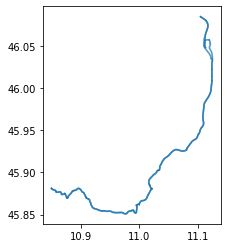

In [102]:
trajectories[91].plot()
plt.show()

In [103]:
trajectories[91].hvplot(geo=True, tiles='EsriImagery', line_width=5, color='lightblue')

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]

So apparently this wasn't a ring trip, but an a/r trip to Garda Lake. Let's investigate more about it.

In [104]:
for i in tqdm(range(len(trajectories))):
    trajectories[i].add_speed(overwrite=True)
for i in tqdm(range(len(trajectories))):
    trajectories[i].df['kmh'] = trajectories[i].df['speed'].apply(utils.ms_to_km)

100%|██████████| 152/152 [00:00<00:00, 532.62it/s]


In [105]:
trajectories[91].df

,longitude,latitude,elevation,geometry,speed,kmh
time,,,,,,
2021-04-24 07:43:50,11.119156,46.057613,263.4,POINT Z (11.11916 46.05761 263.40000),1.618042,5.824950
2021-04-24 07:43:53,11.119101,46.057592,263.2,POINT Z (11.11910 46.05759 263.20000),1.618042,5.824950
2021-04-24 07:44:01,11.118860,46.057567,261.4,POINT Z (11.11886 46.05757 261.40000),2.356896,8.484827
2021-04-24 07:44:08,11.118716,46.057441,248.0,POINT Z (11.11872 46.05744 248.00000),2.556767,9.204360
2021-04-24 07:44:10,11.118725,46.057395,242.8,POINT Z (11.11872 46.05739 242.80000),2.580113,9.288407
...,...,...,...,...,...,...
2021-04-24 18:10:26,11.119483,46.056766,182.4,POINT Z (11.11948 46.05677 182.40000),4.510490,16.237765
2021-04-24 18:10:27,11.119526,46.056744,182.2,POINT Z (11.11953 46.05674 182.20000),4.129420,14.865911
2021-04-24 18:10:30,11.119630,46.056667,182.0,POINT Z (11.11963 46.05667 182.00000),3.916085,14.097904


In [106]:
print("Average pace: {}; max pace: {}".format(np.round(np.average(trajectories[91].df.kmh), 2), np.round(np.max(trajectories[91].df.kmh), 2)))

Average pace: 20.16; max pace: 51.01


20 km/h as average pace isn't so bad, but 51 km/h it's definitely out of my capabilities. Where can I have had that peak?

In [107]:
trajectories[91].hvplot(c='kmh',  geo=True, tiles='OSM', cmap='Reds', line_width=5, colorbar=True)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]   (kmh)

We can see that from Nago to Torbole there is a street portion in which I had a huge pace in a direction, but a really low one in the other direction. Why that?

In [108]:
highSpeed = trajectories[91].df[trajectories[91].df.kmh > 40.0]
highSpeed

,longitude,latitude,elevation,geometry,speed,kmh
time,,,,,,
2021-04-24 10:44:55,10.885169,45.877044,188.0,POINT Z (10.88517 45.87704 188.00000),11.440208,41.184750
2021-04-24 10:45:00,10.884649,45.876551,184.0,POINT Z (10.88465 45.87655 184.00000),13.612350,49.004460
2021-04-24 10:45:05,10.884096,45.876046,177.4,POINT Z (10.88410 45.87605 177.40000),14.133370,50.880133
2021-04-24 10:45:10,10.883541,45.875546,169.6,POINT Z (10.88354 45.87555 169.60000),14.064301,50.631484
2021-04-24 10:45:15,10.883008,45.875038,162.8,POINT Z (10.88301 45.87504 162.80000),14.000708,50.402549
2021-04-24 10:45:19,10.882568,45.874675,157.2,POINT Z (10.88257 45.87468 157.20000),13.216540,47.579545
2021-04-24 10:45:23,10.882104,45.874306,151.6,POINT Z (10.88210 45.87431 151.60000),13.647074,49.129467
2021-04-24 10:45:25,10.881868,45.874115,148.8,POINT Z (10.88187 45.87412 148.80000),14.021509,50.477434
2021-04-24 10:45:27,10.881623,45.873926,145.8,POINT Z (10.88162 45.87393 145.80000),14.169672,51.010819


Excluding the last point, all the others are sequential. This indicates a particular portion of the route where I reached that pace. Could you guess the reason?

In [109]:
print("Segment length: {} m; segment elevation change: {} m".format(np.round(highSpeed[0:1].to_crs('epsg:32632').geometry[0].distance(highSpeed[-2:].to_crs('epsg:32632').geometry[0]), 3), highSpeed[-2:].elevation[0] - highSpeed[0:1].elevation[0]))

Segment length: 908.454 m; segment elevation change: -86.4 m


That's why: 86m of height difference in less than a km, it's a quite steep descent! But truth be told, I still have clear memories about the ascent on our way back.. 

### Activities visualization - first attempt

Plot all hike activities in a map. HVplot guarantees a pleasant visualization, but with hikes it's pointless to find clusters of activities. In any case, this is a good example of how trajectories can be mapped together and be easily identified when not overlapped.

In [110]:
hikesToPlot = mpd.TrajectoryCollection(hikesTrajectories)

In [111]:
hikesToPlot.hvplot(line_width=3, geo=True, tiles='EsriImagery')

:Overlay
   .Tiles.I   :Tiles   [x,y]
   .Path.I    :Path   [Longitude,Latitude]
   .Path.II   :Path   [Longitude,Latitude]
   .Path.III  :Path   [Longitude,Latitude]
   .Path.IV   :Path   [Longitude,Latitude]
   .Path.V    :Path   [Longitude,Latitude]
   .Path.VI   :Path   [Longitude,Latitude]
   .Path.VII  :Path   [Longitude,Latitude]
   .Path.VIII :Path   [Longitude,Latitude]
   .Path.IX   :Path   [Longitude,Latitude]
   .Path.X    :Path   [Longitude,Latitude]
   .Path.XI   :Path   [Longitude,Latitude]
   .Path.XII  :Path   [Longitude,Latitude]
   .Path.XIII :Path   [Longitude,Latitude]
   .Path.XIV  :Path   [Longitude,Latitude]

In [112]:
# about 7-8 mins to render
all = mpd.TrajectoryCollection(trajectories)
#all.hvplot(line_width=3, geo=True, tiles='EsriImagery')

On the other hand, with too many overlapping activities it's complicated to identify how many of them are in a given area (even colours could be misleading). We can isolate starting points and plot them to have a better idea.

In [113]:
starting_points = all.get_start_locations().set_crs('epsg:4326')
starting_points.drop(columns={'kmh', 'speed'}, inplace=True)
starting_points

,elevation,geometry,latitude,longitude
2019-06-06 18:13:25,198.6,POINT Z (11.12007 46.05674 198.60000),46.056745,11.120075
2020-11-19 19:06:51,198.2,POINT Z (11.11502 46.05746 198.20000),46.057457,11.115020
2021-05-08 10:08:24,78.4,POINT Z (10.87843 45.92002 78.40000),45.920023,10.878429
2021-05-04 17:24:42,195.4,POINT Z (11.11215 46.05954 195.40000),46.059543,11.112147
2020-05-17 19:17:09,203.8,POINT Z (11.11181 46.05405 203.80000),46.054046,11.111814
...,...,...,...,...
2019-07-30 18:24:13,188.0,POINT Z (11.11154 46.05242 188.00000),46.052419,11.111539
2021-01-10 18:50:04,189.2,POINT Z (11.11213 46.05954 189.20000),46.059536,11.112131
2020-05-03 19:12:34,201.2,POINT Z (11.11157 46.05244 201.20000),46.052438,11.111570
2021-03-25 19:42:42,216.6,POINT Z (11.12668 46.05870 216.60000),46.058704,11.126684


With a scatter plot of the starting points we can have an idea of how they are distributed.

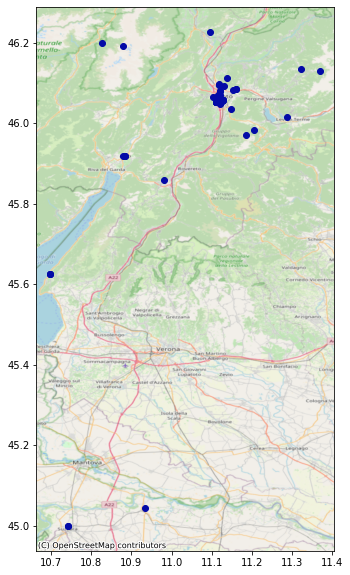

In [114]:
ax = starting_points.plot(figsize=(10,10), color='xkcd:cobalt blue')
ctx.add_basemap(ax, crs=starting_points.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

### Clustering activities

In [115]:
starting_points['x'] = starting_points.to_crs(epsg=3857).geometry.x
starting_points['y'] = starting_points.to_crs(epsg=3857).geometry.y

In [116]:
bounding_box = [starting_points.x.min(), starting_points.y.min(), starting_points.x.max(), starting_points.y.max()]
basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=10,source = ctx.providers.Stamen.Terrain)
data_extent = [starting_points.x.min(), starting_points.x.max(), starting_points.y.min(), starting_points.y.max()]

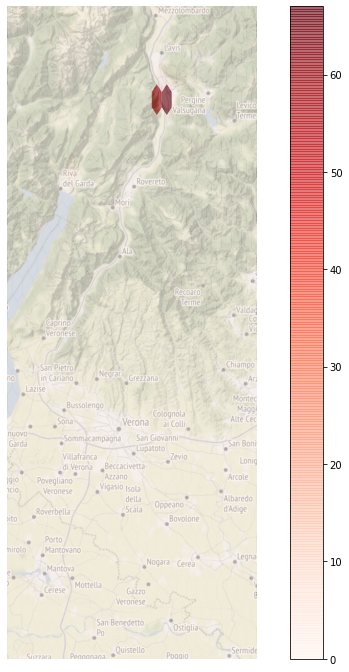

In [117]:
utils.plotHex(starting_points, data_extent, basemap, basemap_extent, hex=25)

As predictable, most activities have been started from Trento. It would be pointless to carry out more analysis at this level, but we can check the distribution over the city area.

In [118]:
trentoBoundary = utils.get_boundary("Trento")

Getting boundaries for Trento
Extracted boundaries for Trento. Time elapsed: 35.04 s


In [119]:
starting_points_tn = gpd.GeoDataFrame()
for i in range(len(starting_points)):
    if trentoBoundary.geometry[0].contains(starting_points[:].geometry[i]):
        starting_points_tn = starting_points_tn.append(starting_points[i:i+1])
print("Attività in zona Trento: {}".format(len(starting_points_tn)))

Attività in zona Trento: 134


In [120]:
bounding_box = [starting_points_tn.x.min(), starting_points_tn.y.min(), starting_points_tn.x.max(), starting_points_tn.y.max()]
basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=14,source = ctx.providers.Stamen.Terrain)
data_extent = [starting_points_tn.x.min(), starting_points_tn.x.max(), starting_points_tn.y.min(), starting_points_tn.y.max()]

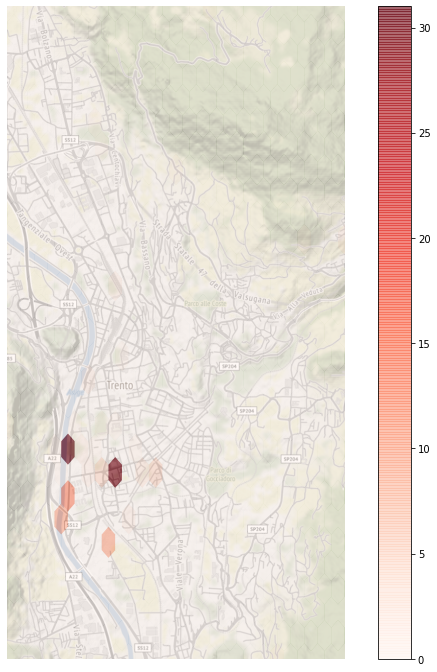

In [121]:
utils.plotHex(starting_points_tn, data_extent, basemap, basemap_extent, hex=25)

It's possible to see a first pattern: most of the activities started in the south-west part of the city, near the Adige river. Is it possible to better understand this?

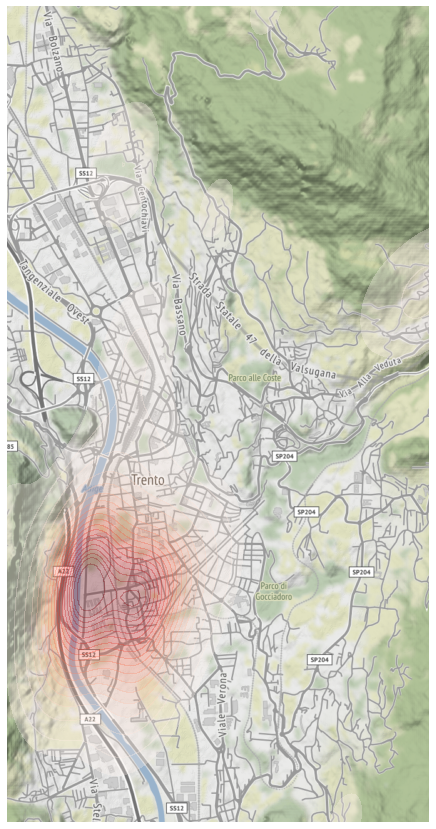

In [122]:
utils.plotKDE(starting_points_tn, data_extent, basemap, basemap_extent, grad=20)

This visualization confirm the main area of starting places. Can we infer something more with a clustering? Maybe the area where I live?

In [123]:
minp = np.round(starting_points_tn.shape[0]*0.15)   # 15% representation
clusterindexes, labels = dbscan(starting_points_tn[['x', 'y']], eps=300, min_samples=minp) # points within 300m
labels=pd.Series(labels, index=starting_points_tn.index)

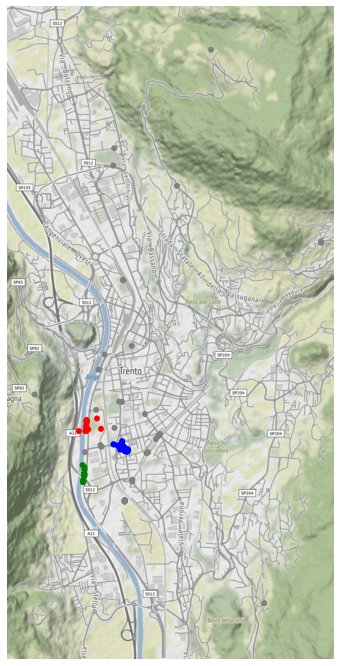

In [124]:
utils.plotClusters(starting_points_tn, labels, basemap, basemap_extent)

Using a dbscan technique it's clear that there are three main areas of starting points: two belongs to the Lungadige, while the other is located in San Pio X neighbourhood. So, assuming that I'm not living on the river, I probably live in the third area found (which is a right guess).

### Strava-like heatmap visualization

For a further visualization, let's check out an heatmap of all the activities loaded. 

In [125]:
coords = []
for i in tqdm(range(len(geo_dfList))):
    for idx, row in geo_dfList[i].iterrows():
        lat = row.latitude
        lon = row.longitude
        coords.append( (lat, lon) )

100%|██████████| 152/152 [00:16<00:00,  9.06it/s]


In [126]:
mapFolium = folium.Map(location=[46.0672,11.1212], tiles='CartoDB dark_matter', zoom_start=12)
plugins.HeatMap(coords, radius=2.5, blur=1.5, min_opacity=0.3, max_value=1, gradient=utils.HEATMAP_GRAD['dark']).add_to(mapFolium)
mapFolium

Thanks to Folium, there is a representation with a heatmap of all the activities. It's easy to notice a greater concentration of points in the areas highlighted before.

## Vigolana Hike - Analysis with OSM

Hiking activities could be interesting to analyze. For example, given that I'm not a good biker (or a good trail runner...yet), activities with an high elevation difference between highest and lowest points should be hikes.

In [127]:
utils.getTopElevationDifference(activities,5)

1° highest elevation difference: 1489.0, activity n° 15, type: Hike
2° highest elevation difference: 1368.6, activity n° 7, type: Hike
3° highest elevation difference: 1266.0, activity n° 121, type: Hike
4° highest elevation difference: 969.6, activity n° 115, type: Hike
5° highest elevation difference: 961.6, activity n° 84, type: Hike


In [128]:
trajectories[115].hvplot(c='elevation',  geo=True, tiles='OSM', cmap='Blues', line_width=5, colorbar=True)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]   (elevation)

### Stops analysis

For example, activity n°115 has been a hike to the Vigolana Shelter (Madonnina) made last summer. Did I took any stop on my way up? Was them for any specific reason?

In [129]:
vigolana = trajectories[115]
stopDetector = mpd.TrajectoryStopDetector(vigolana)
stop_durations = stopDetector.get_stop_time_ranges(min_duration=timedelta(seconds=180), max_diameter=30)
stop_points = stopDetector.get_stop_points(min_duration=timedelta(seconds=180), max_diameter=30)

In [130]:
for i in stop_durations:
    print(i)

Traj 115: 2021-07-21 16:12:34 - 2021-07-21 16:15:40 (duration: 0 days 00:03:06)
Traj 115: 2021-07-21 16:23:13 - 2021-07-21 16:27:03 (duration: 0 days 00:03:50)
Traj 115: 2021-07-21 16:33:47 - 2021-07-21 16:37:31 (duration: 0 days 00:03:44)
Traj 115: 2021-07-21 16:38:45 - 2021-07-21 16:44:36 (duration: 0 days 00:05:51)
Traj 115: 2021-07-21 16:51:21 - 2021-07-21 16:59:48 (duration: 0 days 00:08:27)
Traj 115: 2021-07-21 17:14:49 - 2021-07-21 17:20:11 (duration: 0 days 00:05:22)
Traj 115: 2021-07-21 17:24:14 - 2021-07-21 17:29:49 (duration: 0 days 00:05:35)
Traj 115: 2021-07-21 17:38:10 - 2021-07-21 17:42:09 (duration: 0 days 00:03:59)


In [131]:
# Only eight stops in a short range for more than 3 minutes. Where were them?
stop_points

,geometry,start_time,end_time,traj_id,duration_s
stop_id,,,,,
115_2021-07-21 16:12:34,POINT Z (11.19811 45.97597 1261.80000),2021-07-21 16:12:34,2021-07-21 16:15:40,115,186.0
115_2021-07-21 16:23:13,POINT Z (11.19738 45.97392 1379.00000),2021-07-21 16:23:13,2021-07-21 16:27:03,115,230.0
115_2021-07-21 16:33:47,POINT Z (11.19543 45.97252 1459.40000),2021-07-21 16:33:47,2021-07-21 16:37:31,115,224.0
115_2021-07-21 16:38:45,POINT Z (11.19555 45.97222 1469.80000),2021-07-21 16:38:45,2021-07-21 16:44:36,115,351.0
115_2021-07-21 16:51:21,POINT Z (11.19424 45.97240 1539.20000),2021-07-21 16:51:21,2021-07-21 16:59:48,115,507.0
115_2021-07-21 17:14:49,POINT Z (11.18993 45.97007 1724.00000),2021-07-21 17:14:49,2021-07-21 17:20:11,115,322.0
115_2021-07-21 17:24:14,POINT Z (11.18868 45.96932 1788.80000),2021-07-21 17:24:14,2021-07-21 17:29:49,115,335.0
115_2021-07-21 17:38:10,POINT Z (11.18717 45.96960 1868.60000),2021-07-21 17:38:10,2021-07-21 17:42:09,115,239.0


Let's see where these stops have been taken along the hike.

In [132]:
vigoPlot = vigolana.hvplot(title='Vigolana Hike', line_width=3, tiles='StamenTerrain', cmap='Blues', c='elevation', colorbar=True)
stopPlot = vigoPlot * stop_points.hvplot(geo=True, size='duration_s', color='red')
stopPlot

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Path.I   :Path   [Longitude,Latitude]   (elevation)
   .Points.I :Points   [Longitude,Latitude]   (duration_s)

A possible cause for the stops could be the high elevation gain made in a short time. Let's check if it's the case.

In [133]:
stop_points = utils.getStopElevationDiff(stop_points, vigolana).set_crs(epsg=4326)
stop_points

,geometry,start_time,end_time,traj_id,duration_s,elevation_diff,time_diff
stop_id,,,,,,,
115_2021-07-21 16:12:34,POINT Z (11.19811 45.97597 1261.80000),2021-07-21 16:12:34,2021-07-21 16:15:40,115,186.0,231.0,0 days 00:20:17
115_2021-07-21 16:23:13,POINT Z (11.19738 45.97392 1379.00000),2021-07-21 16:23:13,2021-07-21 16:27:03,115,230.0,117.2,0 days 00:07:33
115_2021-07-21 16:33:47,POINT Z (11.19543 45.97252 1459.40000),2021-07-21 16:33:47,2021-07-21 16:37:31,115,224.0,80.4,0 days 00:06:44
115_2021-07-21 16:38:45,POINT Z (11.19555 45.97222 1469.80000),2021-07-21 16:38:45,2021-07-21 16:44:36,115,351.0,10.4,0 days 00:01:14
115_2021-07-21 16:51:21,POINT Z (11.19424 45.97240 1539.20000),2021-07-21 16:51:21,2021-07-21 16:59:48,115,507.0,69.4,0 days 00:06:45
115_2021-07-21 17:14:49,POINT Z (11.18993 45.97007 1724.00000),2021-07-21 17:14:49,2021-07-21 17:20:11,115,322.0,184.8,0 days 00:15:01
115_2021-07-21 17:24:14,POINT Z (11.18868 45.96932 1788.80000),2021-07-21 17:24:14,2021-07-21 17:29:49,115,335.0,64.8,0 days 00:04:03
115_2021-07-21 17:38:10,POINT Z (11.18717 45.96960 1868.60000),2021-07-21 17:38:10,2021-07-21 17:42:09,115,239.0,79.8,0 days 00:08:21


In some cases stops could explained by elevation gain in a short amount of time, but in other there should be different reasons. A good viewpoint to take pictures while resting, maybe? Let's check with the longest stop I took.

In [134]:
longestStop = stop_points[stop_points.duration_s==max(stop_points.duration_s)]

### Including OSM data for the analysis

In [135]:
bbox = vigolana.get_mcp()

In [136]:
# All point of interests in the minimum convex polygon containing the hike
hikeOSM = pyrosm.OSM("./data/altopiano_della_vigolana.osm.pbf", bounding_box=bbox)
hikePois = hikeOSM.get_pois()
hikePois

,lat,tags,version,changeset,lon,timestamp,id,name,operator,ref,drinking_water,bicycle,information,tourism,geometry,osm_type,amenity,building
0,45.972450,"{""direction"":""N""}",3,0.0,11.194252,1594922072,910787221,Polsa,None,None,None,None,None,viewpoint,POINT (11.19425 45.97245),node,NaN,NaN
1,45.971054,"{""ele"":""2030"",""fee"":""yes"",""capacity"":""6""}",6,0.0,11.185942,1572786755,914756310,Bivacco Vigolana,Società Alpinisti Tridentini,None,no,None,None,wilderness_hut,POINT (11.18594 45.97105),node,NaN,NaN
2,45.976658,"{""mtb"":""yes"",""horse"":""yes"",""hiking"":""yes""}",1,0.0,11.198959,1340702685,1802521175,None,None,None,None,no,guidepost,information,POINT (11.19896 45.97666),node,NaN,NaN
3,45.979012,"{""mtb"":""yes"",""horse"":""yes"",""hiking"":""yes""}",1,0.0,11.201583,1340702687,1802521237,None,None,None,None,no,guidepost,information,POINT (11.20158 45.97901),node,NaN,NaN
4,45.980946,"{""mtb"":""yes"",""horse"":""yes"",""hiking"":""yes""}",1,0.0,11.203117,1340702689,1802521309,None,None,None,None,no,guidepost,information,POINT (11.20312 45.98095),node,NaN,NaN
5,45.982376,"{""mtb"":""yes"",""horse"":""yes"",""hiking"":""yes""}",1,0.0,11.203637,1340702689,1802521315,None,None,None,None,no,guidepost,information,POINT (11.20364 45.98238),node,NaN,NaN
6,45.969315,"{""hiking"":""yes"",""wikimedia_commons"":""File:Segn...",4,0.0,11.185840,1615634668,4437914625,None,None,425-444,None,None,guidepost,information,POINT (11.18584 45.96931),node,NaN,NaN
7,NaN,NaN,2,NaN,NaN,1532186863,152409892,Bivacco Madonnina,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((11.18591 45.97107, 11.18596 45.97107...",way,shelter,yes


In [137]:
for i in range(len(hikePois)):
    if hikePois.to_crs('epsg:32632').geometry.values[i].buffer(10).contains(longestStop.to_crs('epsg:32632').geometry.values[0]):
        print("Name: {}; tourism: {}".format(hikePois.at[i, 'name'], hikePois.at[i, 'tourism']))

Name: Polsa; tourism: viewpoint


Apparently, I stopped for a short break, but also to take a nice picture and enjoy the view. Let's confirm it in the map seen before, but changing the layer with a more appropriate one.

In [138]:
vigoPlot = vigolana.hvplot(title='Vigolana Hike', line_width=3, tiles='OSM', cmap='Blues', c='elevation', colorbar=True)
stopPlot = vigoPlot * longestStop.hvplot(geo=True, size='duration_s', color='red')
stopPlot

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Path.I   :Path   [Longitude,Latitude]   (elevation)
   .Points.I :Points   [Longitude,Latitude]   (duration_s)

As expected, with the OSM layer we can see that the longest stop has been taken in proximity (within 10m) of the viewpoint Polsa.  
Fun fact: this viewpoint has been mapped last time in 2020 by the user Martin Larcher (https://www.openstreetmap.org/node/910787221); at the end of the hike we just analyzed, I spent the night in the Madonnina shelter with...Martin Larcher himself, along with his family! 

## Performance analysis

Let's look into another aspect of running activities: running performances over time. Was there performance difference over time? How can they be measured?

In [139]:
for i in tqdm(range(len(runsTrajectories))):
    runsTrajectories[i].add_speed(overwrite=True)
for i in tqdm(range(len(runsTrajectories))):
    runsTrajectories[i].df['kmh'] = runsTrajectories[i].df['speed'].apply(utils.ms_to_km)

100%|██████████| 135/135 [00:00<00:00, 578.40it/s]


### Getting average pace and runs' lengths

In [140]:
runAvg = pd.DataFrame(columns={'date', 'avgPace', 'length'})
for i in tqdm(range(len(runsTrajectories))):
    runAvg.at[i, 'date'] = runsTrajectories[i].get_start_time()
    runAvg.at[i, 'avgPace'] = runsTrajectories[i].df.kmh.mean()
    runAvg.at[i, 'length'] = runsTrajectories[i].get_length()/1000

100%|██████████| 135/135 [00:32<00:00,  4.10it/s]


In [141]:
runAvg.sort_values(by='date', inplace=True)
runAvg.reset_index(drop=True, inplace=True)
for i in tqdm(range(len(runAvg))):
    runAvg.date[i] = runAvg.date[i].strftime("%Y-%m-%d")
runAvg

100%|██████████| 135/135 [00:00<00:00, 2947.85it/s]


,length,avgPace,date
0,5.80499,10.9627,2019-04-09
1,3.00899,12.725,2019-04-11
2,3.9967,12.8169,2019-04-16
3,3.94465,11.2084,2019-04-17
4,3.01506,12.7177,2019-05-01
...,...,...,...
130,6.45656,10.4523,2021-08-30
131,8.03258,12.7818,2021-09-23
132,10.0129,12.1618,2021-09-27
133,6.60791,11.4554,2021-09-29


### Exploiting VO2Max data

VO2Max is a measure of maximum oxygen consumption per minute for any muscle contraction. This is a biological parameter which can be partially improved by trainings. Was I able to modify it through my activities? When did it decrease?

In [142]:
data = []
vo2 = pd.DataFrame()
for file in tqdm(os.listdir("data/vo2/")):
    with open("data/vo2/{}".format(file), 'r') as f:
        data = json.loads([line.strip() for line in f][0])
        vo2 = vo2.append(data)
vo2.reset_index(drop=True, inplace=True)
vo2.drop(columns={'userProfilePK', 'deviceId','subSport', 'activityUuid'}, inplace=True)
vo2

100%|██████████| 10/10 [00:00<00:00, 124.80it/s]


,calendarDate,timestampGmt,sport,activityId,vo2MaxValue
0,2019-03-20,2019-03-20T18:53:32.0,RUNNING,3479925555,53.0
1,2019-03-26,2019-03-26T18:39:07.0,RUNNING,3498156058,53.0
2,2019-04-02,2019-04-02T17:44:54.0,RUNNING,3519671950,53.0
3,2019-04-09,2019-04-09T18:14:30.0,RUNNING,3541479161,54.0
4,2019-04-11,2019-04-11T06:43:22.0,RUNNING,3545420258,56.0
...,...,...,...,...,...
133,2021-05-14,2021-05-14T11:57:57.0,RUNNING,6777359705,52.0
134,2021-05-15,2021-05-15T09:54:00.0,RUNNING,6782369267,51.0
135,2021-05-18,2021-05-18T17:57:59.0,RUNNING,6802088682,51.0
136,2021-05-23,2021-05-23T18:53:58.0,RUNNING,6830626048,51.0


## Efforts comparison

In [143]:
complete = pd.merge(runAvg, vo2, left_on='date', right_on='calendarDate', how="inner")
complete.drop(columns={'calendarDate'}, inplace=True)
complete

,length,avgPace,date,timestampGmt,sport,activityId,vo2MaxValue
0,5.80499,10.9627,2019-04-09,2019-04-09T18:14:30.0,RUNNING,3541479161,54.0
1,3.00899,12.725,2019-04-11,2019-04-11T06:43:22.0,RUNNING,3545420258,56.0
2,3.9967,12.8169,2019-04-16,2019-04-16T17:51:35.0,RUNNING,3561796047,56.0
3,3.94465,11.2084,2019-04-17,2019-04-17T17:34:43.0,RUNNING,3564901233,56.0
4,3.01506,12.7177,2019-05-01,2019-05-01T18:48:20.0,RUNNING,3609227182,56.0
...,...,...,...,...,...,...,...
118,5.01024,13.2755,2021-08-14,2021-08-14T18:45:04.0,RUNNING,7304989718,52.0
119,8.03258,12.7818,2021-09-23,2021-09-23T18:48:04.0,RUNNING,7541750132,53.0
120,10.0129,12.1618,2021-09-27,2021-09-27T18:26:23.0,RUNNING,7564463452,51.0
121,6.60791,11.4554,2021-09-29,2021-09-29T17:38:44.0,RUNNING,7575641530,52.0


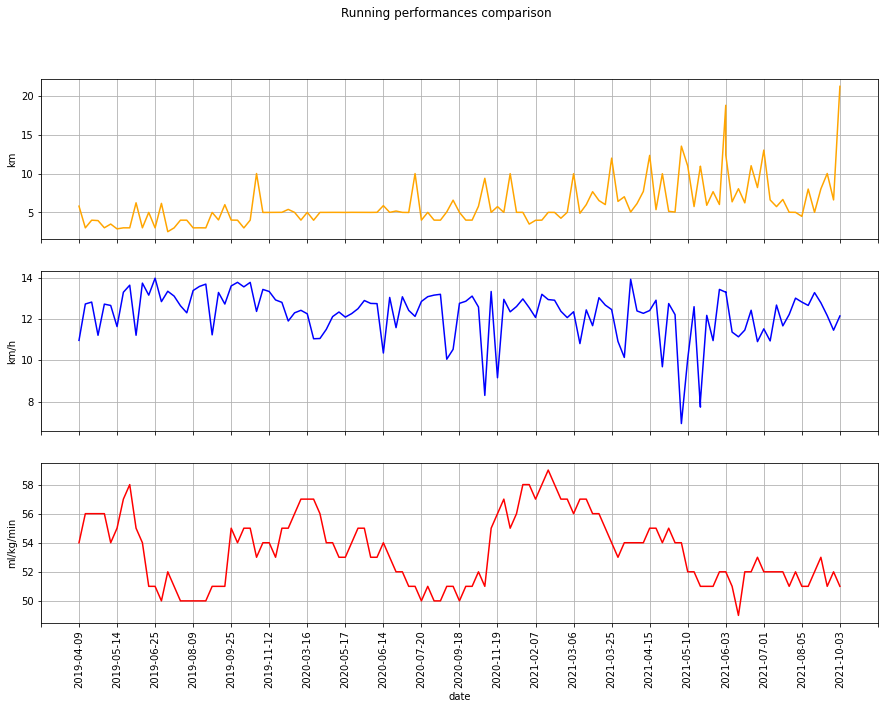

In [144]:
utils.plotRunComparison(complete)

There are some patterns that could be noticed:
* activities' length increased over time, but the average pace didn't change too much (except for some isolated activities)
* VO2Max had a low point after the 2020 spring lockdown, as predictable
* interestingly, autumn 2020 and winter 2021 were the period in which I was more trained (according to VO2Max); in fact, in that period activities' length started to raise, but the average pace didn't decreased